In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import mplfinance as mpf
import plotly.graph_objects as go


company_df = pd.read_csv('data/sp500_companies.csv')
stock_df = pd.read_csv('data/sp500_stocks.csv')


In [2]:

# Assuming stock_df is your DataFrame
stock_df['MA_50'] = stock_df.groupby('Symbol')['Close'].rolling(window=50).mean().reset_index(level=0, drop=True)
stock_df['MA_200'] = stock_df.groupby('Symbol')['Close'].rolling(window=200).mean().reset_index(level=0, drop=True)
stock_df['std_50'] = stock_df.groupby('Symbol')['Close'].rolling(window=50).std().reset_index(level=0, drop=True)
stock_df['std_200'] = stock_df.groupby('Symbol')['Close'].rolling(window=200).std().reset_index(level=0, drop=True)
stock_df['upper_band_50'] = stock_df['MA_50'] + (stock_df['std_50'] * 2)
stock_df['lower_band_50'] = stock_df['MA_50'] - (stock_df['std_50'] * 2)
stock_df['upper_band_200'] = stock_df['MA_200'] + (stock_df['std_200'] * 2)
stock_df['lower_band_200'] = stock_df['MA_200'] - (stock_df['std_200'] * 2)
stock_df['Z-score'] = (stock_df['Close'] - stock_df['Close'].mean()) / stock_df['Close'].std()
stock_df['Daily Return'] = stock_df.groupby('Symbol')['Close'].pct_change().reset_index(level=0, drop=True)
company_df.fillna(0, inplace=True)
stock_df.fillna(0, inplace=True)
stock_df

/var/folders/75/l95mxw1j5w9ddljb82_6_m_40000gn/T/ipykernel_62561/879308511.py:11: FutureWarning: The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  stock_df['Daily Return'] = stock_df.groupby('Symbol')['Close'].pct_change().reset_index(level=0, drop=True)


,Date,Symbol,Adj Close,Close,High,Low,Open,Volume,MA_50,MA_200,std_50,std_200,upper_band_50,lower_band_50,upper_band_200,lower_band_200,Z-score,Daily Return
0,2010-01-04,MMM,46.422302,69.414719,69.774246,69.122070,69.473244,3640265.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.164713,0.000000
1,2010-01-05,MMM,46.131523,68.979935,69.590302,68.311035,69.230766,3405012.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.166801,-0.006264
2,2010-01-06,MMM,46.785759,69.958191,70.735786,69.824417,70.133781,6301126.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.162103,0.014182
3,2010-01-07,MMM,46.819294,70.008362,70.033447,68.662209,69.665550,5346240.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.161862,0.000717
4,2010-01-08,MMM,47.149204,70.501671,70.501671,69.648827,69.974915,4073337.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.159492,0.007046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1862101,2024-09-12,ZTS,190.710007,190.710007,190.869995,187.139999,189.979996,1046000.0,182.353201,179.563800,4.435347,12.255396,191.223894,173.482507,204.074593,155.053008,0.417889,0.003790
1862102,2024-09-13,ZTS,191.089996,191.089996,192.619995,190.139999,190.570007,1725200.0,182.663000,179.625300,4.494600,12.282326,191.652200,173.673801,204.189953,155.060648,0.419714,0.001992
1862103,2024-09-16,ZTS,194.250000,194.250000,194.449997,191.210007,192.250000,1263400.0,183.048800,179.711700,4.645275,12.324260,192.339350,173.758251,204.360220,155.063181,0.434892,0.016537
1862104,2024-09-17,ZTS,195.710007,195.710007,196.309998,194.000000,194.479996,1962900.0,183.454401,179.811301,4.847437,12.372804,193.149275,173.759526,204.556909,155.065692,0.441904,0.007516


In [3]:
stock_df.columns

Index(['Date', 'Symbol', 'Adj Close', 'Close', 'High', 'Low', 'Open', 'Volume',
       'MA_50', 'MA_200', 'std_50', 'std_200', 'upper_band_50',
       'lower_band_50', 'upper_band_200', 'lower_band_200', 'Z-score',
       'Daily Return'],
      dtype='object')

Text(0.5, 1.0, 'Correlation Matrix')

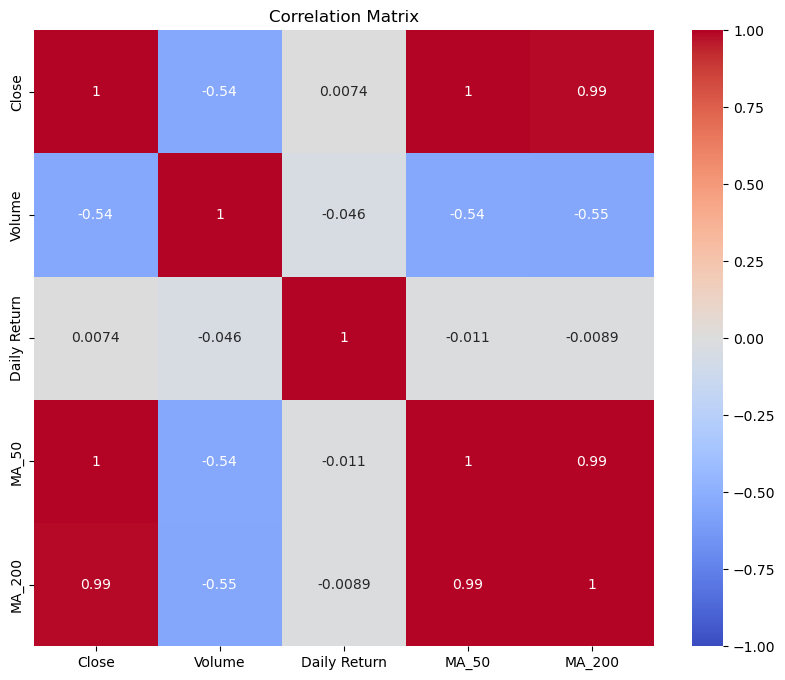

In [9]:
apple = stock_df[stock_df['Symbol'] == 'AAPL']
columns_of_interest = ['Close', 'Volume', 'Daily Return', 'MA_50', 'MA_200']
correlation_matrix = apple[columns_of_interest].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
# plt.show()

In [13]:
alt.data_transformers.disable_max_rows()
def plot_closing_price(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Close:Q', title='Closing Price'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q'])
    ).properties(
        title=f'{company} Closing Price',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_closing_price(stock_df, 'AAPL')

alt.Chart(...)

In [14]:

def plot_volume(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Volume:Q', title='Volume'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q'], format='.2f')
    ).properties(
        title=f'{company} Volume',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_volume(stock_df, 'AAPL')

alt.Chart(...)

In [26]:


def plot_moving_average(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('MA_50:Q', title='MA_50'),
        # alt.Y2('MA_200:Q', title='MA_200'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q'], format='.2f')
    ).properties(
        title=f'{company} Moving Average',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_moving_average(stock_df, 'AAPL')

alt.Chart(...)

In [16]:

def plot_candlestick(df, company,window:list = None):
    filtered_df = df[df['Symbol'] == company]
    filtered_df = filtered_df[filtered_df['Date'] >= window[0]]
    filtered_df = filtered_df[filtered_df['Date'] <= window[1]]
    filtered_df['Date'] = pd.to_datetime(filtered_df['Date'])
    df = filtered_df
    candlestick = go.Candlestick(
        x=df['Date'],
        open=df['Open'],
        high=df['High'],
        low=df['Low'],
        close=df['Close'],
        name='Candlestick'
        )
    
    volume = go.Bar(
        x=df['Date'],
        y=df['Volume'],
        name='Volume',
        marker_color='blue',
        opacity=0.5,
        yaxis='y2'
    )

    layout = go.Layout(
        title= f'{company} Candlestick Chart',
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price', showgrid=True),
        yaxis2=dict(title='Volume', overlaying='y', side='right', showgrid=False),
        xaxis_rangeslider_visible=False,
        hovermode='x unified',
        plot_bgcolor='white'
    )

    fig = go.Figure(
        data=[candlestick, volume],
        layout=layout
        )
    fig.show()
plot_candlestick(stock_df, 'AAPL', window=['2020-01-01', '2021-01-01'])

In [17]:

def plot_daily_return(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_bar().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Daily Return:Q', title='Daily Return'),
        alt.Color('Daily Return:Q', scale=alt.Scale(scheme='redblue')),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q', 'Daily Return:Q'], format='.2f')
    ).properties(
        title=f'{company} Daily Return',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_daily_return(stock_df, 'AAPL')

alt.Chart(...)

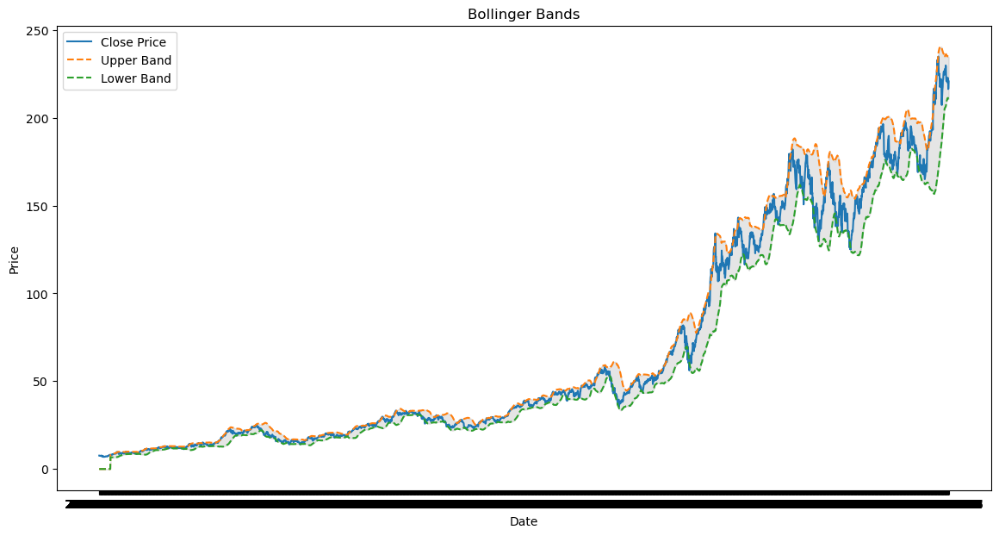

In [18]:
def plot_bollinger_bands(df, company):
    df = df[df['Symbol'] == company]
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'], df['Close'], label='Close Price')
    plt.plot(df['Date'], df['upper_band_50'], label='Upper Band', linestyle='--')
    plt.plot(df['Date'], df['lower_band_50'], label='Lower Band', linestyle='--')
    plt.fill_between(df['Date'], df['upper_band_50'], df['lower_band_50'], color='gray', alpha=0.2)
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title('Bollinger Bands')
    plt.legend()
    plt.show()
plot_bollinger_bands(stock_df, 'AAPL')

In [19]:
def plot_Z_score(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Z-score:Q', title='Z-score'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q', 'Z-score:Q'], format='.2f')
    ).properties(
        title=f'{company} Z-score',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_Z_score(stock_df, 'AAPL')

alt.Chart(...)

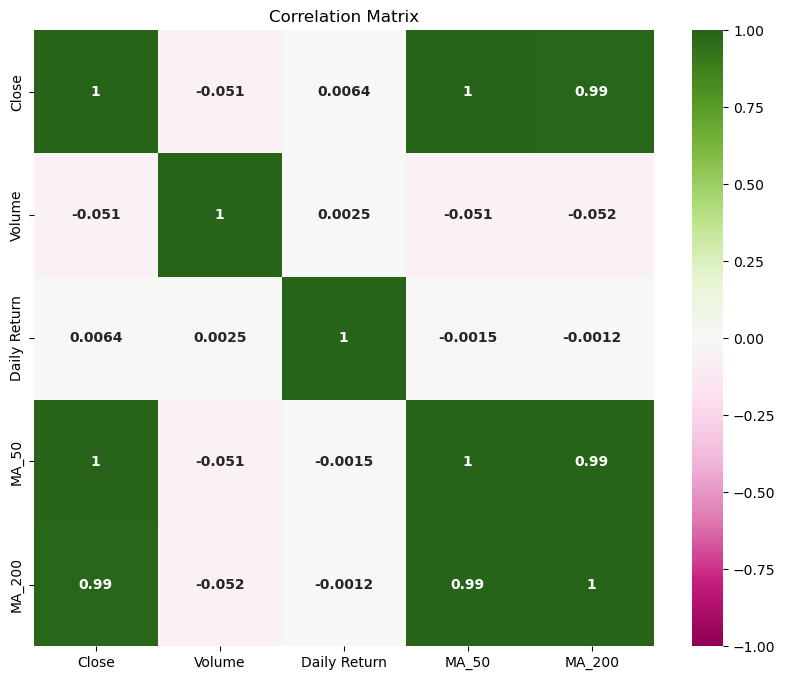

In [21]:
def plot_correlation_matrix(df, company):
    columns_of_interest = ['Close', 'Volume', 'Daily Return', 'MA_50', 'MA_200']
    correlation_matrix = df[columns_of_interest].corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        correlation_matrix, 
        annot=True, 
        cmap='PiYG', 
        vmin=-1, 
        vmax=1, 
        annot_kws={"size": 10, "weight": "bold"}  
        )
    plt.title('Correlation Matrix')
    plt.show()
plot_correlation_matrix(stock_df, 'AAPL')